## Create Patches

In [2]:
%load_ext autoreload
%autoreload 2

%pylab inline
import numpy as np
from utils import *
import cv2
import random




Populating the interactive namespace from numpy and matplotlib


/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/site-packages/IPython/core/magics/pylab.py:160: UserWarning: pylab import has clobbered these variables: ['size']
`%matplotlib` prevents importing * from pylab and numpy
  "\n`%matplotlib` prevents importing * from pylab and numpy"


In [3]:
test_images = np.load('test_images.npy')
post_seg = np.load('post_seg.npy')

test_images.shape
post_seg.shape

(2085, 300, 300)

In [4]:
model_output = np.load('model_output.npy')

In [26]:
model_output.shape

(2085, 300, 300)

In [5]:
overlapped = overlap(test_images, model_output)
overlapped_gray = np.average(overlapped, axis = 3)
overlapped_gray = overlapped_gray.astype(np.uint8)



In [6]:
def auto_canny(image, sigma=0.33):
    # compute the median of the single channel pixel intensities
    # we need to remove all zeros when doing this
    image_cp = np.copy(image).astype(np.float)
    image_cp[image_cp == 0] = np.nan
    v = np.nanmedian(image_cp)
    

    # apply automatic Canny edge detection using the computed median
    lower = int(max(0, (1.0 - sigma) * v))
    upper = int(min(255, (1.0 + sigma) * v))
    edged = cv2.Canny(image, lower, upper)

    # return the edged image
    return edged

In [7]:
random_index = random.randint(0,2000)
random_index

81

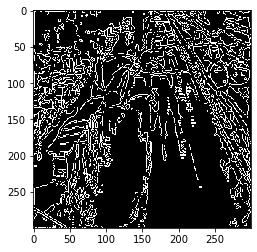

In [8]:
edges = auto_canny(overlapped_gray[random_index])
plt.imshow(edges, cmap='gray')

In [9]:
test_images = test_images.astype(np.uint8)
post_seg = post_seg.astype(np.uint8)

In [10]:
# I wonder what will happen when we try contour detection on overlapped / gray image (none postprocessed)



rows = 7
cols = 8
size = 30
fig, axes = plt.subplots(rows, cols, figsize = (size*cols, size*rows), sharex = True, sharey = True)
import random


for i in range(rows):
    
    random_index = random.randint(0, post_seg.shape[0])
    
    
    
    patches = detect_patches(overlapped_gray[random_index])
    detected_img = draw_patches(test_images[random_index], patches)
    
    
    
    ret, overlapped_thresh = cv2.threshold(overlapped_gray[random_index],1,255,cv2.THRESH_BINARY)
    axes[i,0].imshow(test_images[random_index])
    axes[i,1].imshow(overlapped_gray[random_index], cmap = 'gray')
    axes[i,2].imshow(overlapped_thresh, cmap = 'gray')
    axes[i,3].imshow(detected_img)

    # What if we do canny detection on the overlapped image?
    edges = cv2.Canny(overlapped_gray[random_index],100,200)
    axes[i,4].imshow(edges, cmap = 'gray')
    patches = detect_patches(edges)
    detected_img = draw_patches(test_images[random_index], patches)
    axes[i,5].imshow(detected_img)
    edges_auto = auto_canny(overlapped_gray[random_index])
    axes[i,6].imshow(edges_auto, cmap = 'gray')
    patches = detect_patches(edges_auto)
    detected_img = draw_patches(test_images[random_index], patches)
    axes[i,7].imshow(detected_img)



No contours in image
No contours in image
No contours in image


/nethome/jbang36/anaconda3/envs/eva_37/lib/python3.7/site-packages/numpy/lib/function_base.py:3405: RuntimeWarning: All-NaN slice encountered
  r = func(a, **kwargs)


In [68]:
# what would happen if we did postseg-> overlap -> canny -> box detection?
overlapped_post1 = overlap(test_images, post_seg)

In [89]:

# let's work on our own post method... enlarge the white area and take away things that are not 'bright enough'
rows = 5
cols = 9
size = 30
fig, axes = plt.subplots(rows, cols, figsize = (size*cols, size*rows), sharex = True, sharey = True)
for ii in range(rows):
    ri = random.randint(0, 2000)
    tmp = test_images[ri]
    tmp_seg = model_output[ri]

    labels, results = post_individual(tmp_seg)
    assert(len(labels) == len(results))
    print(labels)

    for i in range(min(cols,len(results))):
        axes[ii,i].imshow(results[i], cmap = 'gray')

    #overlap the image
    post = results[-1]
    patches = detect_patches(post)
    detected_img = draw_patches(tmp, patches)
    axes[ii,5].imshow(detected_img)
    
    overlapped = overlap1(tmp, post)
    axes[ii,6].imshow(overlapped)

    #perform canny
    overlapped_gray = np.average(overlapped, axis = 2)
    overlapped_gray = overlapped_gray.astype(np.uint8)
    edges_auto = auto_canny(overlapped_gray)
    axes[ii,7].imshow(edges_auto, cmap = 'gray')

    patches = detect_patches(edges_auto)
    detected_img = draw_patches(tmp, patches)
    axes[ii,8].imshow(detected_img)


['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']


In [91]:
#### I like the blurring, how about we increase the white area so that canny detection works better? ####
## make post_individual2

from utils import *


# let's work on our own post method... enlarge the white area and take away things that are not 'bright enough'
rows = 5
cols = 9
size = 30
fig, axes = plt.subplots(rows, cols, figsize = (size*cols, size*rows), sharex = True, sharey = True)
for ii in range(rows):
    ri = random.randint(0, 2000)
    tmp = test_images[ri]
    tmp_seg = model_output[ri]

    labels, results = post_individual_v2(tmp_seg)
    assert(len(labels) == len(results))
    print(labels)

    for i in range(min(cols,len(results))):
        axes[ii,i].imshow(results[i], cmap = 'gray')

    #overlap the image
    post = results[-1]
    patches = detect_patches(post)
    detected_img = draw_patches(tmp, patches)
    axes[ii,5].imshow(detected_img)
    
    overlapped = overlap1(tmp, post)
    axes[ii,6].imshow(overlapped)

    #perform canny
    overlapped_gray = np.average(overlapped, axis = 2)
    overlapped_gray = overlapped_gray.astype(np.uint8)
    edges_auto = auto_canny(overlapped_gray)
    axes[ii,7].imshow(edges_auto, cmap = 'gray')

    patches = detect_patches(edges_auto, mode = 1)
    detected_img = draw_patches(tmp, patches)
    axes[ii,8].imshow(detected_img)



['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']
['median blur', 'opening', 'dilation', 'ostu on median', 'otsu after dilation']


## This is the final results!!!! We will change this to a function and utilize!!

In [11]:
from utils import *

# let's work on our own post method... enlarge the white area and take away things that are not 'bright enough'
rows = 5
cols = 9
size = 30
fig, axes = plt.subplots(rows, cols, figsize = (size*cols, size*rows), sharex = True, sharey = True)
for ii in range(rows):
    ri = random.randint(0, 2000)
    tmp = test_images[ri]
    tmp_seg = model_output[ri]

    labels, results = post_individual_v2(tmp_seg)
    assert(len(labels) == len(results))
    print(labels)

    for i in range(min(cols,len(results))):
        axes[ii,i].imshow(results[i], cmap = 'gray')

    #overlap the image
    post = results[-1]
    patches = detect_patches(post)
    detected_img = draw_patch(tmp, patches)
    axes[ii,2].imshow(detected_img)
    
    overlapped = overlap1(tmp, post)
    axes[ii,3].imshow(overlapped)
    
    detected_img = draw_patches(tmp, patches)
    axes[ii,4].imshow(detected_img)
    
    ### Let's do box filtering!! TODO!!!!
    ## 1. If box is too small, then exclude it
    ## 2. If the box aspect ratio is bad ( too horizontal, then exclude)
    new_patches = filter_patches(patches)
    detected_img = draw_patches(tmp, new_patches)
    axes[ii,5].imshow(detected_img)

    
    

['median blur', 'ostu on median']
['median blur', 'ostu on median']
['median blur', 'ostu on median']
['median blur', 'ostu on median']
['median blur', 'ostu on median']


In [38]:
## Save the boxes generated from segmentation

n_samples = test_images.shape[0]
for i, image in enumerate(test_images):
    tmp = test_images[i]
    tmp_seg = model_output[i]

    labels, results = post_individual_v2(tmp_seg)
    assert(len(labels) == len(results))
    
    #for i in range(min(cols,len(results))):
    #    axes[ii,i].imshow(results[i], cmap = 'gray')

    #overlap the image
    post = results[-1]
    patches = detect_patches(post)
    detected_img = draw_patch(tmp, patches)
    #axes[ii,2].imshow(detected_img)
    
    overlapped = overlap1(tmp, post)
    #axes[ii,3].imshow(overlapped)
    
    detected_img = draw_patches(tmp, patches)
    #axes[ii,4].imshow(detected_img)
    
    ### Let's do box filtering!! TODO!!!!
    ## 1. If box is too small, then exclude it
    ## 2. If the box aspect ratio is bad ( too horizontal, then exclude)
    new_patches = filter_patches(patches)
    detected_img = draw_patches(tmp, new_patches)
    
    
    #axes[ii,5].imshow(detected_img)
    
    #instead of drawing the patches, we now want to crop the section and save to patches/.
    #The naming convention will be img{image_id}_{patch_number}.jpg
    #crop_img = img[y:y+h, x:x+w]
    if new_patches == None:
        continue
    for ii, patch in enumerate(new_patches):
        ## TODO: need to make sure the new_patches that are detected are in a certain format
        crop_img = tmp[patch[1]:patch[1]+patch[3], patch[0]:patch[0]+patch[2]]
        folder = 'patches'
        filename = 'img{:05d}'.format(i + 1) + "_" + '{:02d}'.format(ii + 1)
        cv2.imwrite(os.path.join(folder, filename)+ '.jpg', crop_img)
        

No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image
No contours in image


In [27]:
"img{:05d}".format(1)

'img00001'